In [1]:
%%time

import os
import sys

sys.path.append('../')
sys.path.append('/usr/local/bin')

import numpy as np
from pygeo.segyread import SEGYFile
from pygeo.fullpy import readini
from pymatsolver import MumpsSolver
from zephyr.backend import MiniZephyr, Eurus
from zephyr.middleware import HelmBaseProblem, HelmBaseSurvey, FullwvDatastore

os.chdir('noel')

CPU times: user 196 ms, sys: 92 ms, total: 288 ms
Wall time: 328 ms


In [2]:
%%time

fds = FullwvDatastore('noel')
systemConfig = fds.systemConfig

systemConfig.update({
    'disc':     MiniZephyr,
    'Solver':   MumpsSolver,
})

problem = HelmBaseProblem(systemConfig)
survey  = HelmBaseSurvey(systemConfig)
problem.pair(survey)

CPU times: user 40 ms, sys: 0 ns, total: 40 ms
Wall time: 38.2 ms


In [3]:
%%time

print('Running %(nfreq)d frequencies and %(nsrc)s sources'%{'nfreq': survey.nfreq, 'nsrc': survey.nsrc})

dPred = survey.dpred().reshape((survey.nrec, survey.nsrc, survey.nfreq))

Running 20 frequencies and 265 sources
CPU times: user 28.5 s, sys: 34.5 s, total: 1min 2s
Wall time: 1min 39s


In [4]:
%pylab inline
matplotlib.rcParams['savefig.dpi'] = 300

Populating the interactive namespace from numpy and matplotlib


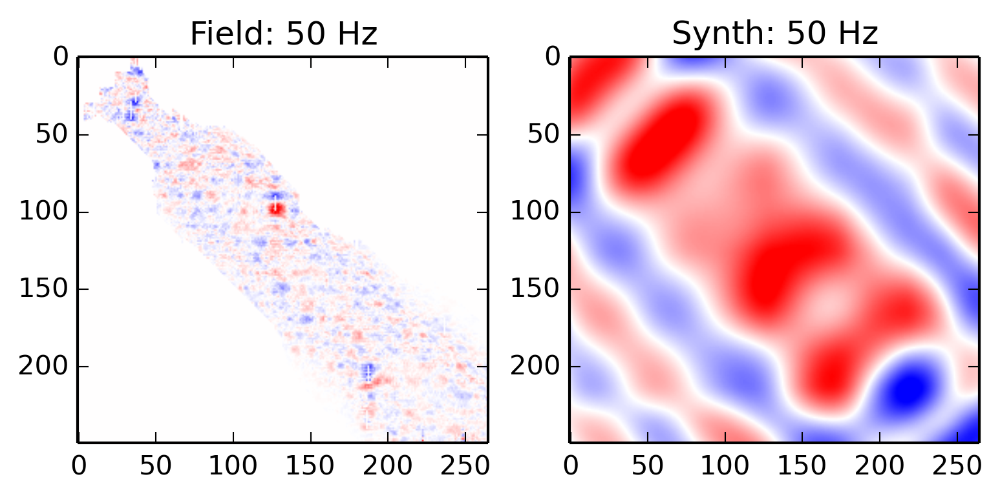

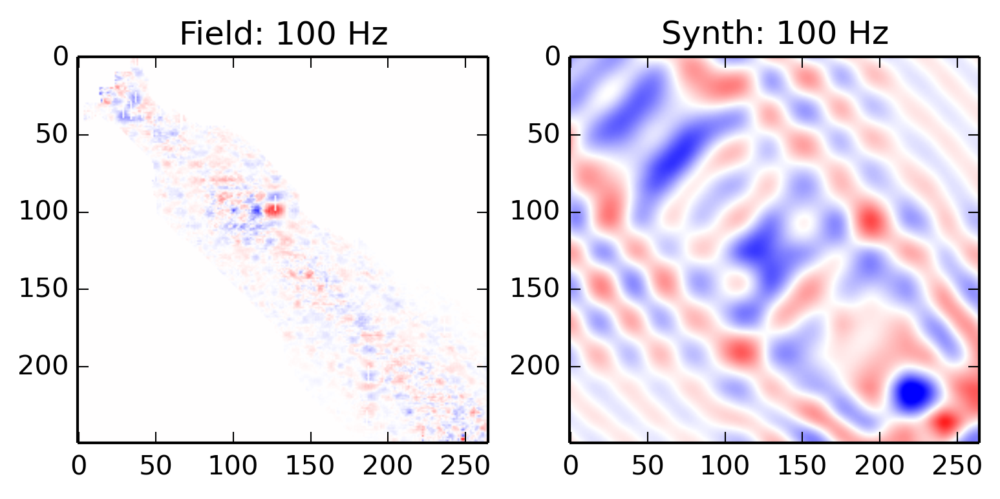

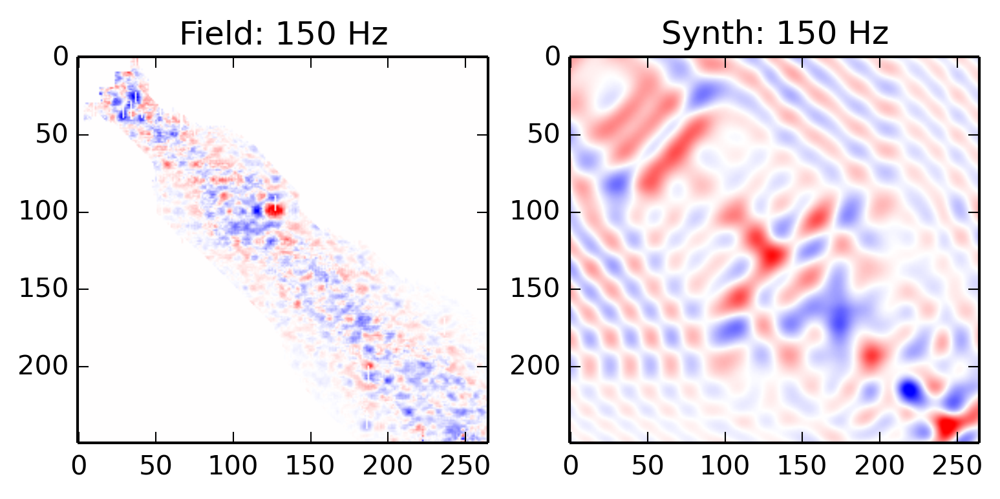

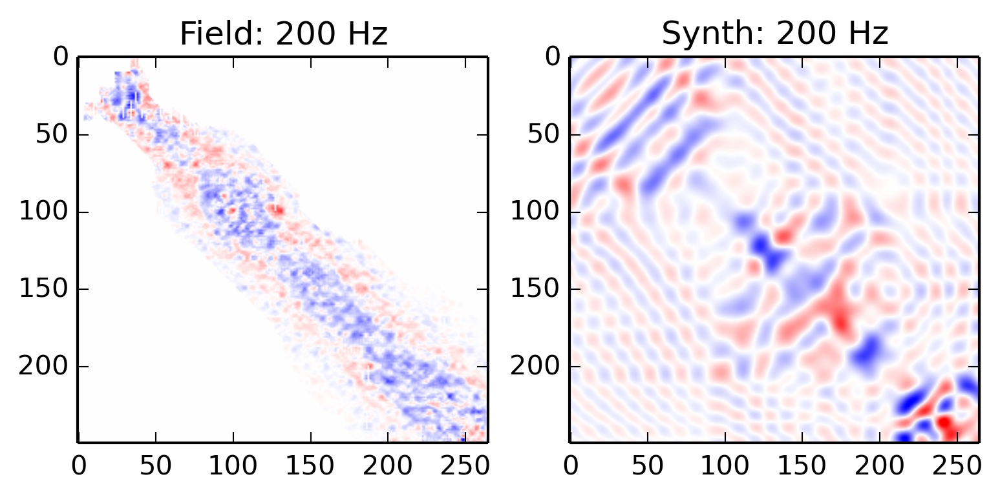

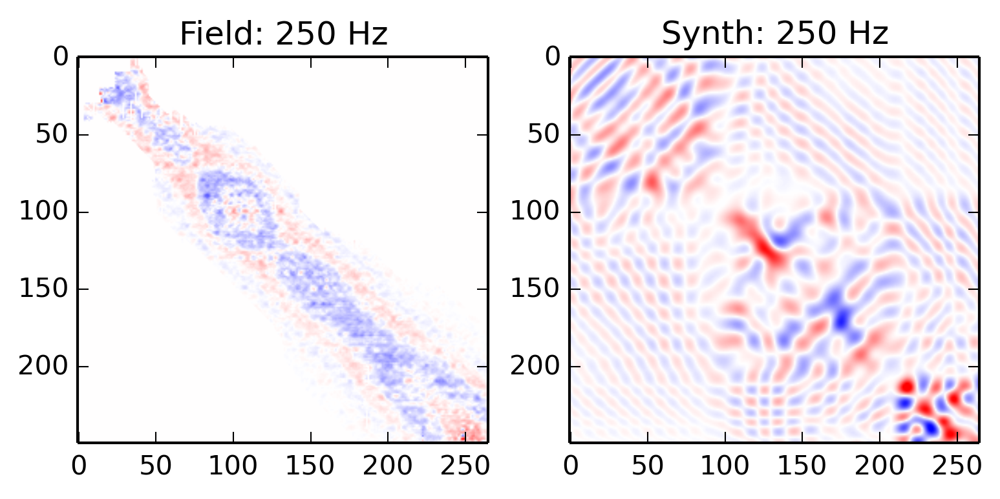

...

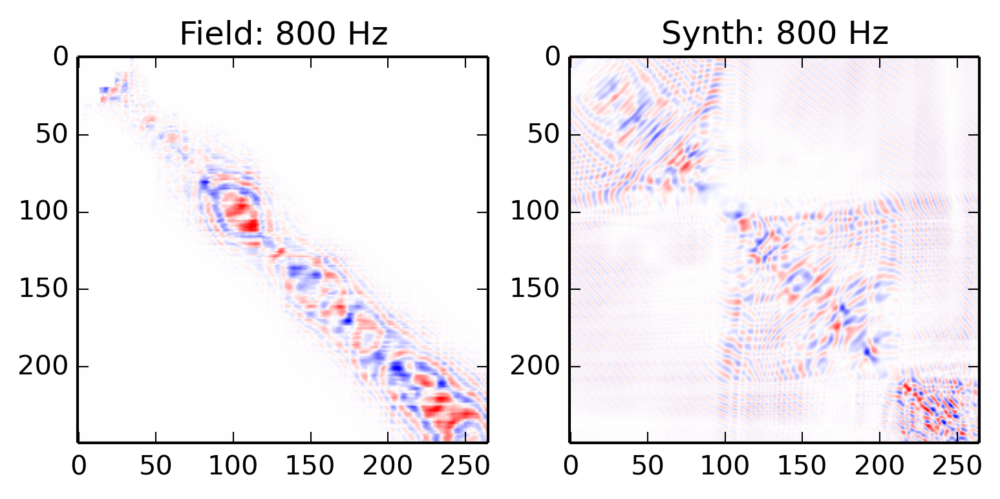

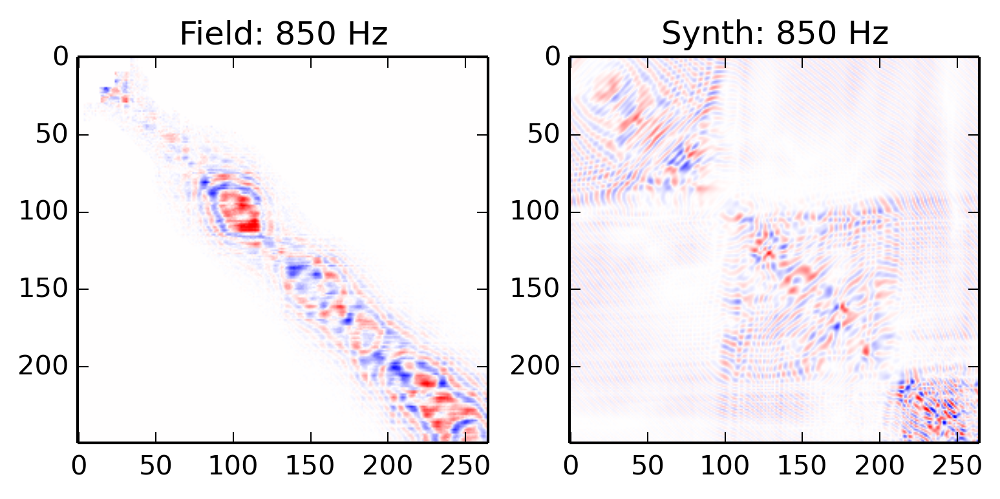

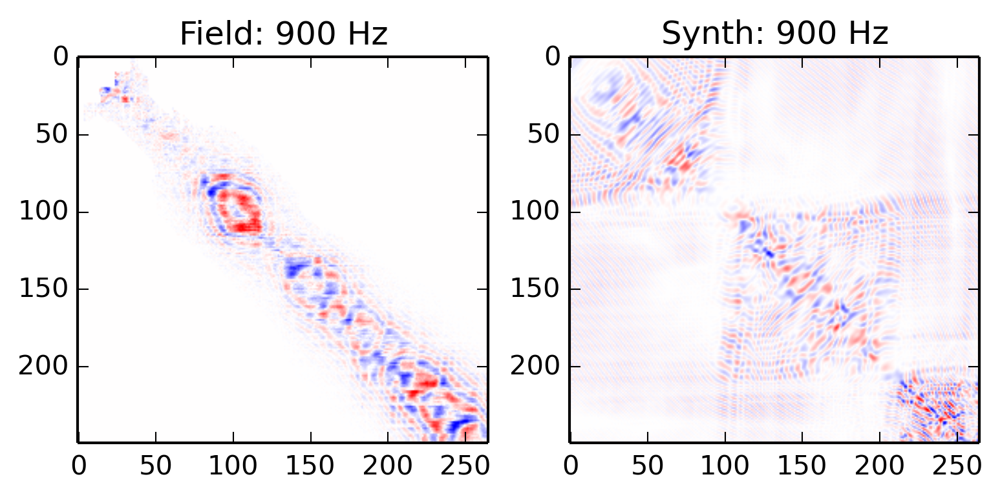

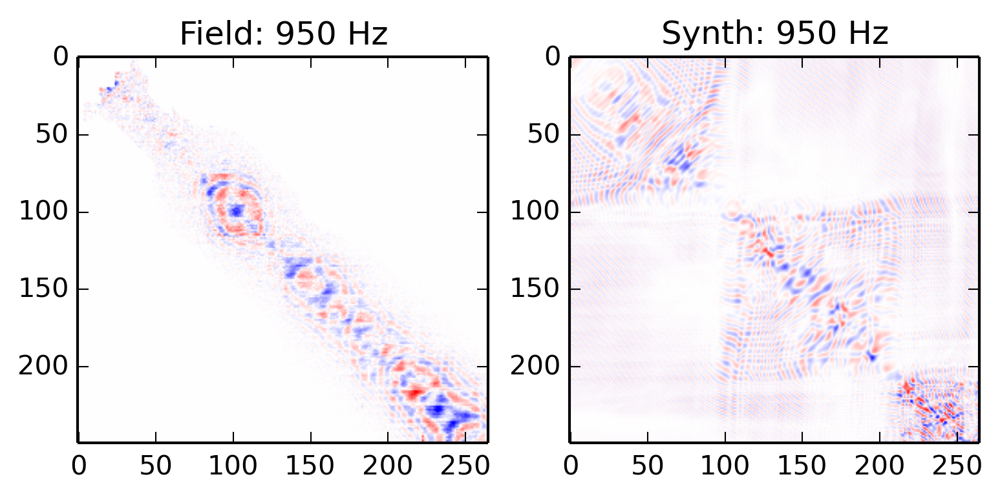

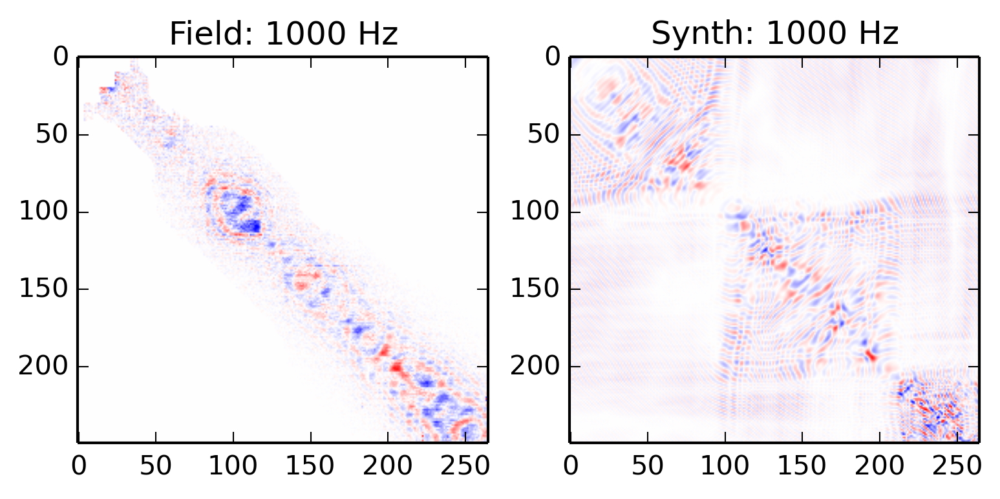

In [5]:
dObs = fds.spoolData()

for i in xrange(survey.nfreq):
    fig = figure(dpi=100)
    
    subplot(1,2,1)
    data = dObs.next().real
    clip = 0.8*abs(data).max()
    imshow(data, vmin=-clip, vmax=clip, cmap=cm.bwr)
    title('Field: %0.0f Hz'%survey.freqs[i])
    
    subplot(1,2,2)
    data = dPred[:,:,i].real
    clip = 0.8*abs(data).max()
    imshow(data, vmin=-clip, vmax=clip, cmap=cm.bwr)
    title('Synth: %0.0f Hz'%survey.freqs[i])